In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [20, 10]
import pandas as pd
%matplotlib inline

In [2]:
# Read and set the index to be the date

data = 5*[0]

for station in range(1, 6):
    
    data[station-1] = pd.read_csv('../../datasets/TX-Data/soil_station/SM_'+str(station)+'.dat', sep=",")

    # pandas remove spaces in the column names
    data[station-1].columns = data[station-1].columns.str.replace(' ','')
    for depth in [5, 10, 20, 50]: 
        data[station - 1]['SWC_'+str(depth)] = data[station-1]['SWC_'+str(depth)].astype(float)
        data[station - 1]['T_'+str(depth)] = data[station-1]['T_'+str(depth)].astype(float)
        data[station - 1]['Ppt'] = data[station-1]['Ppt'].astype(float)
    
    
    # Parse the date and set the
    data[station-1]['Date'] = pd.to_datetime(data[station-1]['Date'], format='%m/%d/%y %H:%M', errors='coerce')
    data[station-1] = data[station-1].set_index('Date')

# stations 0 to 4 means 1 to 5 
data[1]

,Ppt,SWC_5,SWC_10,SWC_20,SWC_50,T_5,T_10,T_20,T_50,Flag
Date,,,,,,,,,,
2015-01-01 00:00:00,0.00,0.181,0.158,0.224,0.439,5.85,6.81,8.33,12.24,0
2015-01-01 01:00:00,0.00,0.181,0.158,0.224,0.439,5.75,6.69,8.24,12.21,0
2015-01-01 02:00:00,0.00,0.181,0.158,0.224,0.439,5.71,6.61,8.16,12.19,0
2015-01-01 03:00:00,0.00,0.181,0.158,0.224,0.439,5.67,6.56,8.07,12.16,0
2015-01-01 04:00:00,0.51,0.181,0.158,0.224,0.439,5.62,6.50,8.02,12.14,0
...,...,...,...,...,...,...,...,...,...,...
2021-09-30 20:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13107
2021-09-30 21:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13107
2021-09-30 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13107


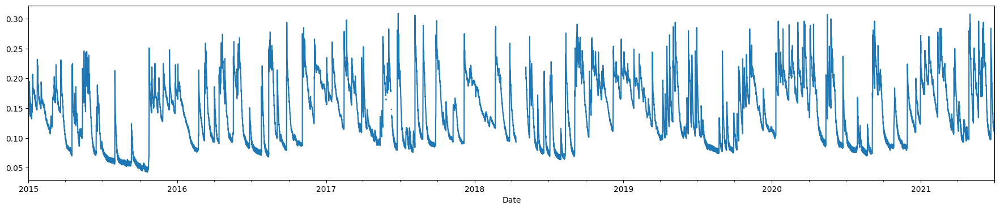

In [3]:
# Docs here https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html#pandas.DataFrame.plot
%matplotlib inline

data[0].loc["2015":"2021-06"].SWC_5.plot(figsize=(22,4))
plt.savefig("SWC_5-Station-1-All-Years.pdf", format="pdf", bbox_inches="tight")

plt.show()

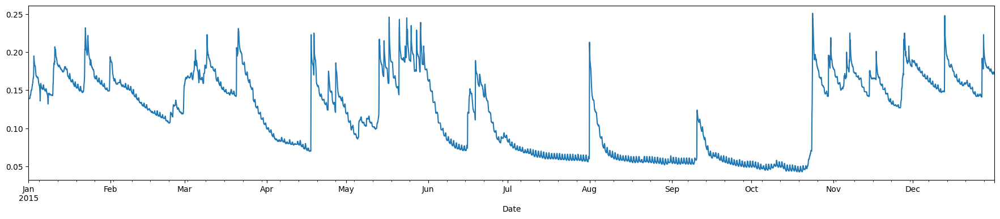

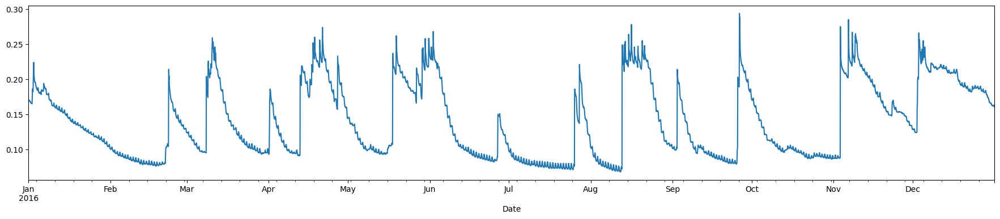

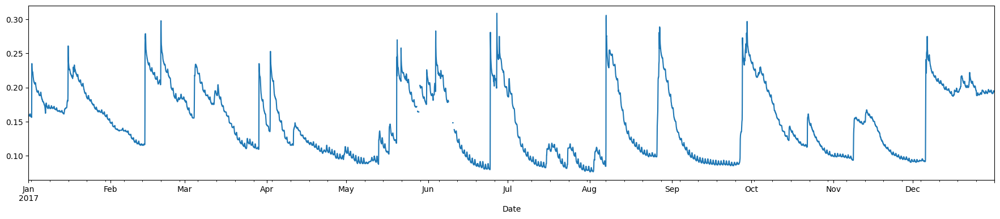

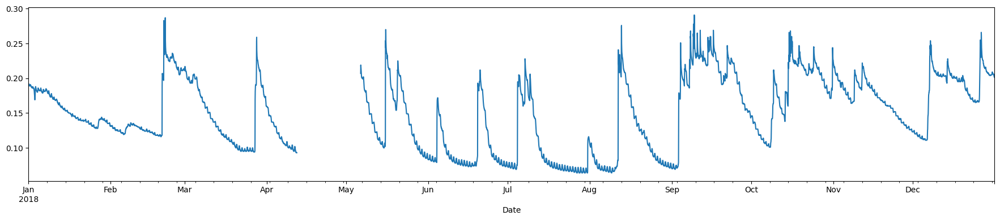

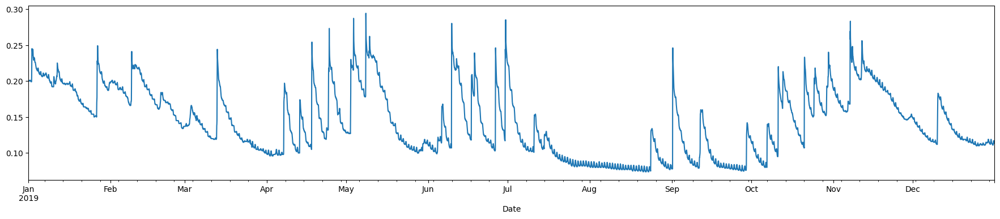

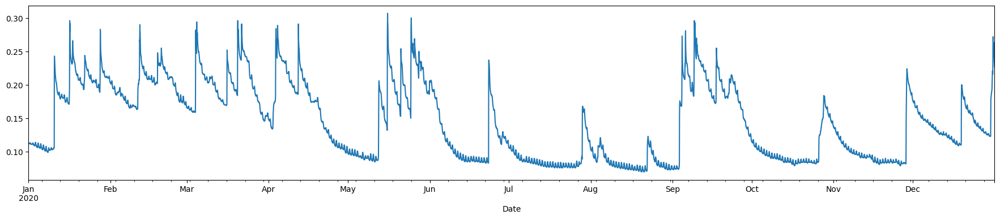

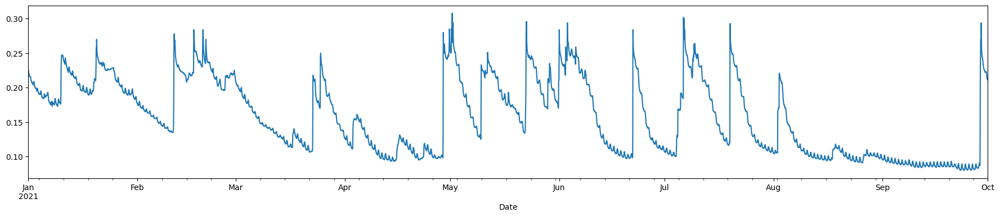

In [4]:
# Docs here https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html#pandas.DataFrame.plot
%matplotlib inline
years = [str(item) for item in range(2015, 2022)]

for i in years:
    data[0].loc[i].SWC_5.plot(figsize=(22,4))
    plt.savefig("SWC_5-Station-1-Year"+i+".pdf", format="pdf", bbox_inches="tight")

    plt.show()

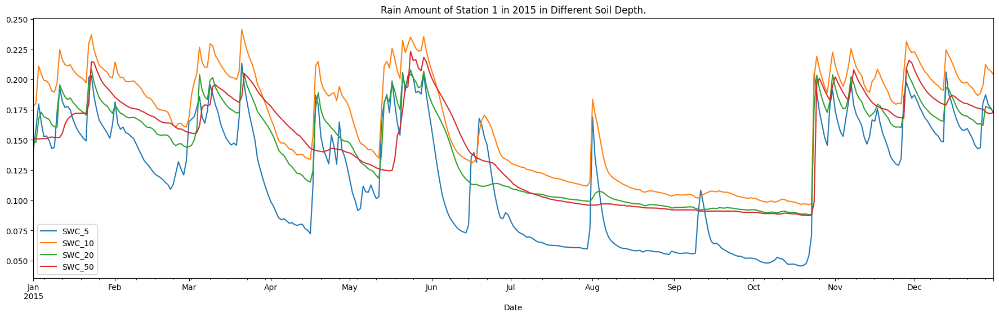

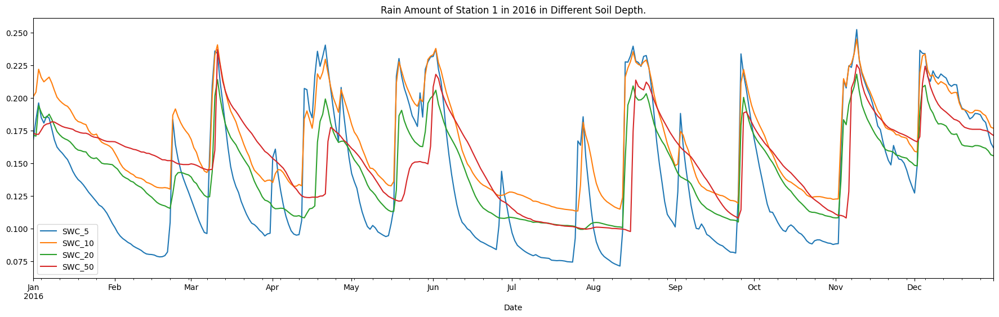

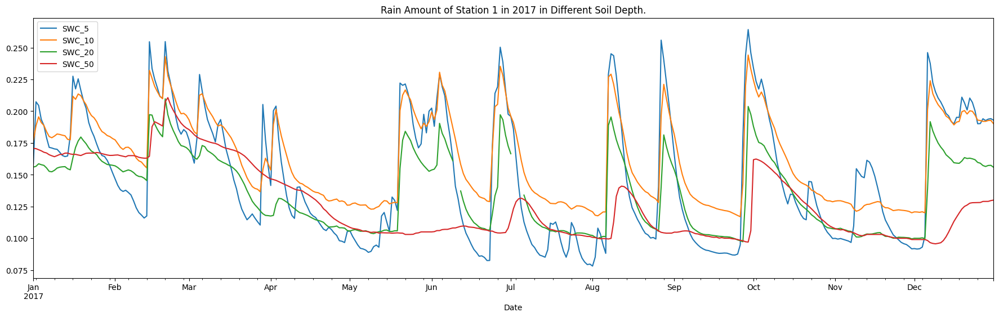

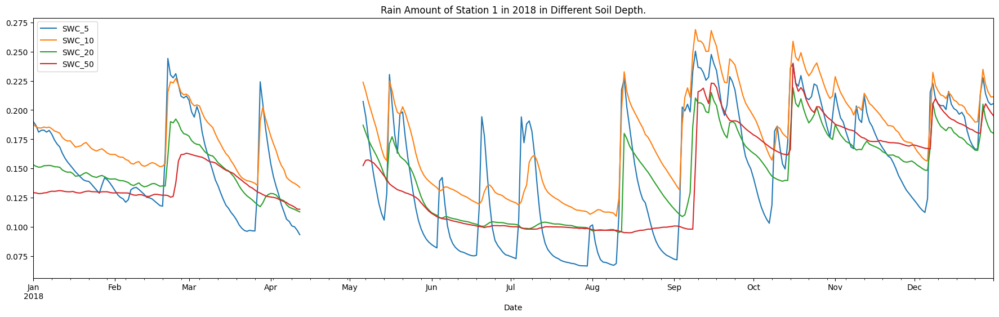

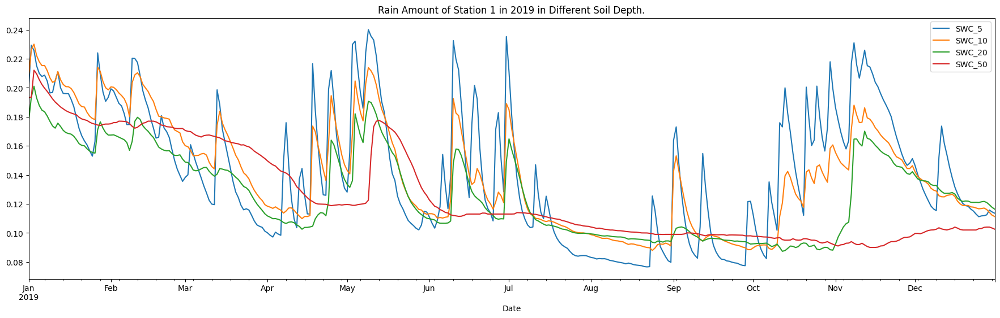

...

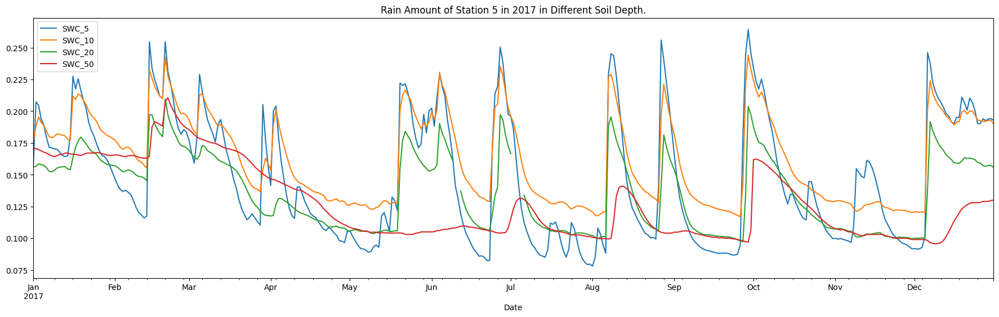

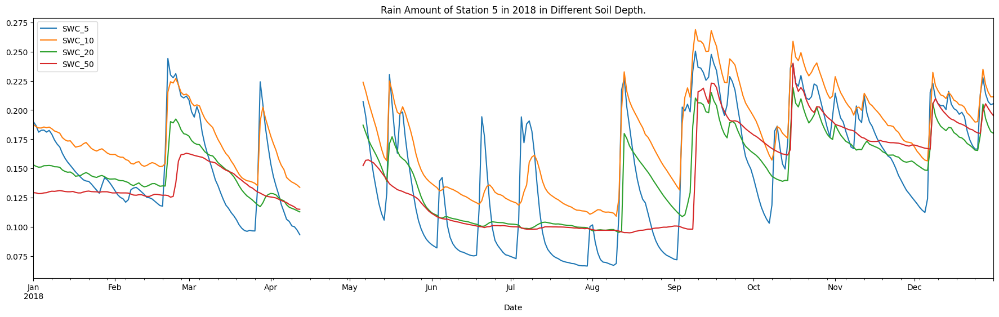

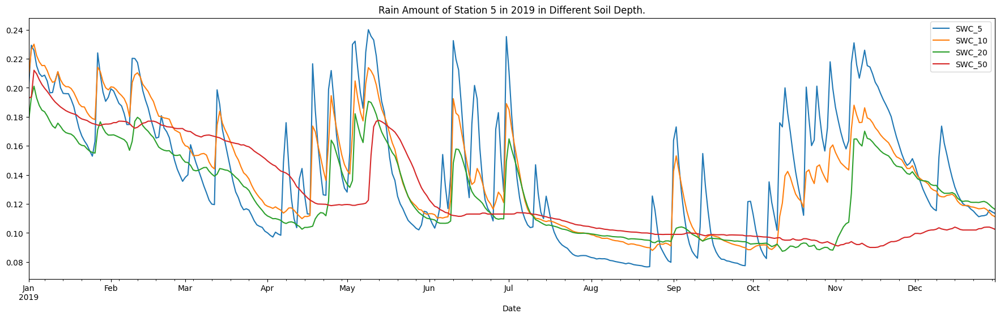

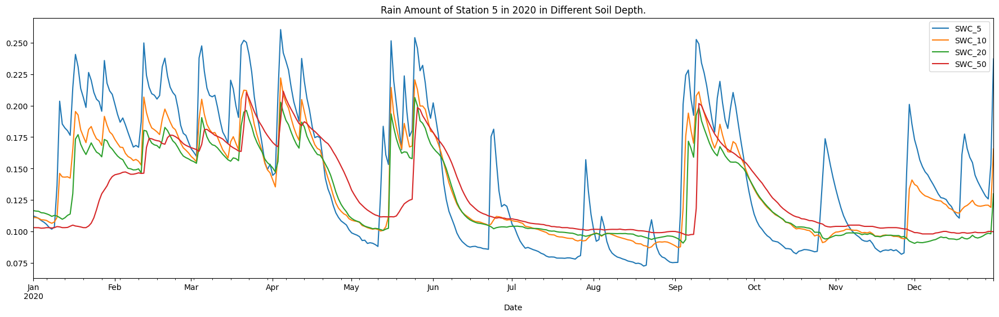

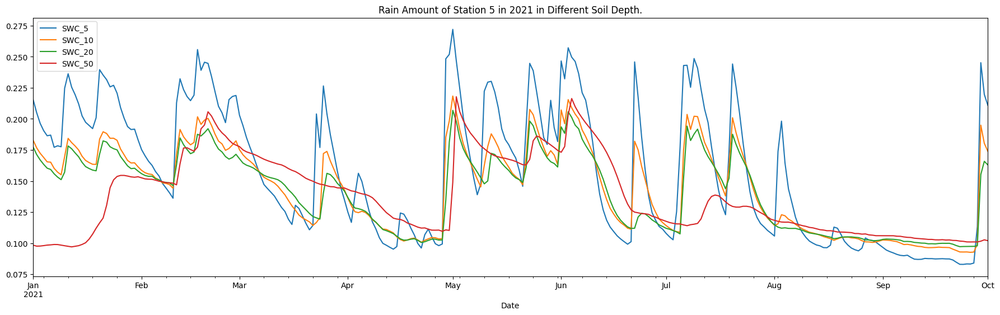

In [19]:
%matplotlib inline
years = [str(item) for item in range(2015, 2022)]
for station in range(0,5):
    for i in years:
        data[0].loc[i].resample('D').mean(numeric_only=True).plot(figsize=(22,6), y=["SWC_5", "SWC_10", "SWC_20", "SWC_50"])
        plt.title('Rain Amount of Station ' + str(station+1) +' in ' + str(i) + ' in Different Soil Depth.')
        plt.savefig("SWC_5_10_20_50_-Station-1-Year"+i+".pdf", format="pdf", bbox_inches="tight")
        plt.show()

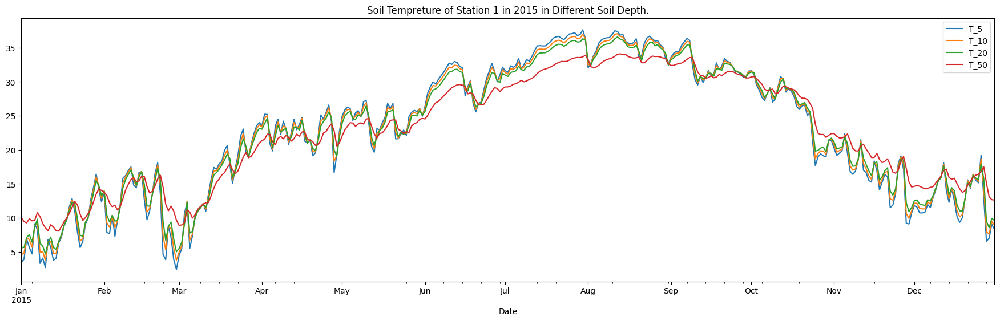

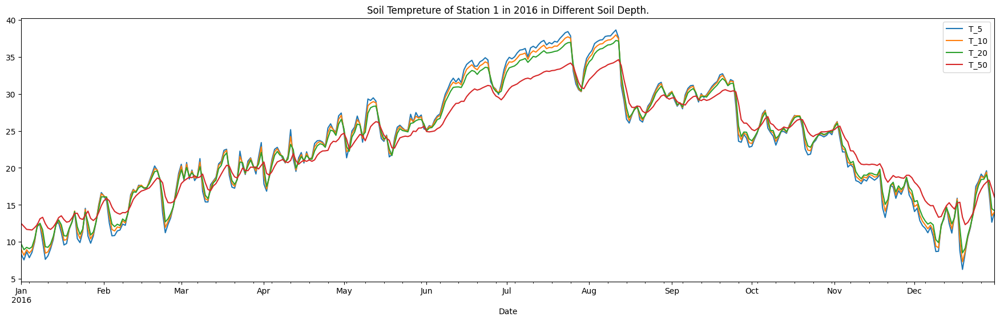

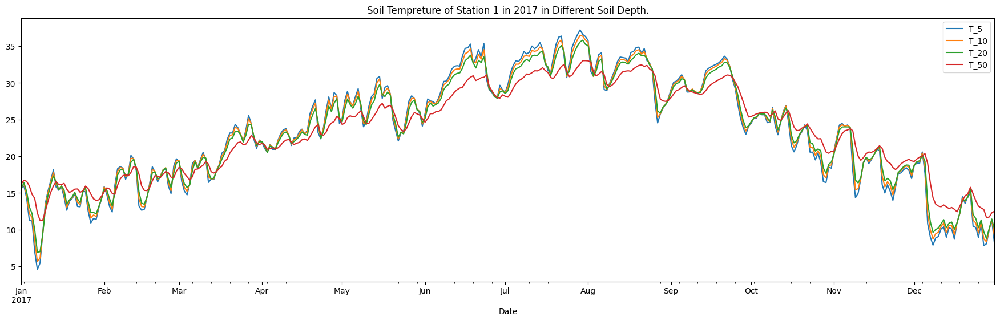

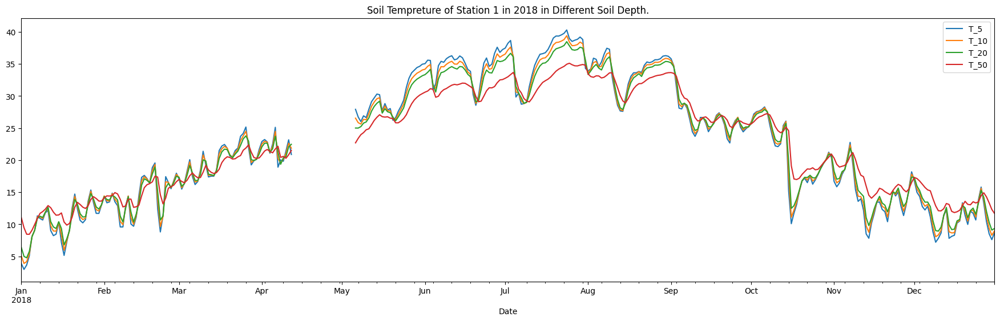

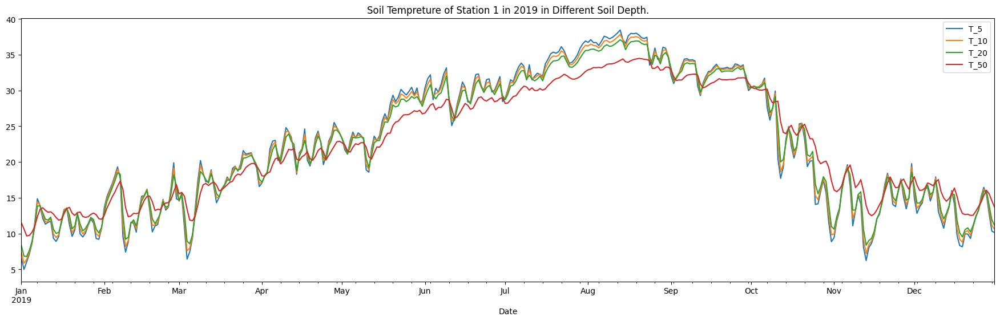

...

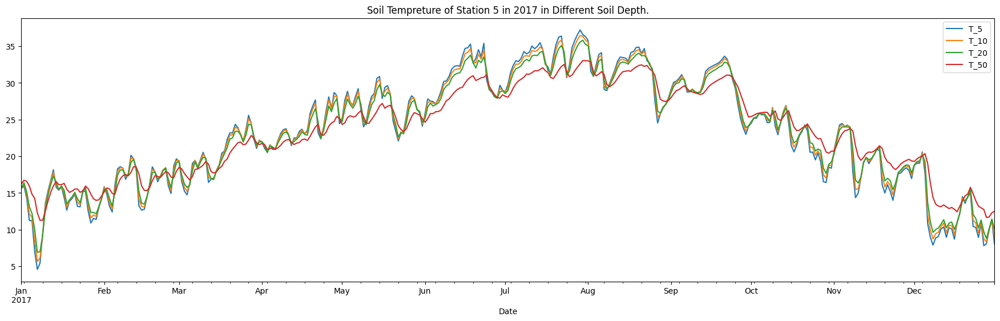

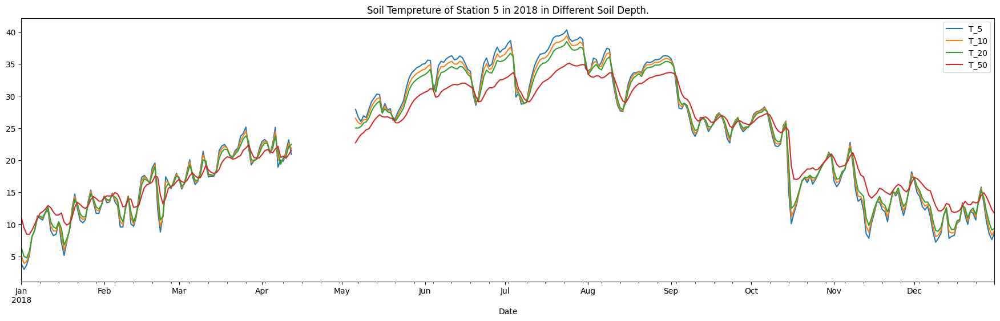

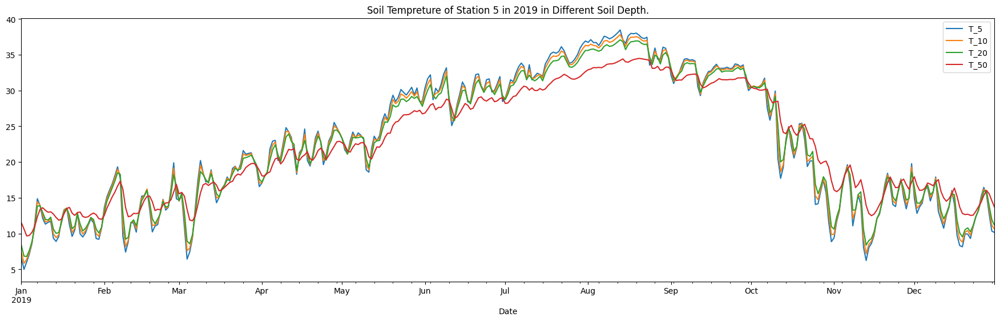

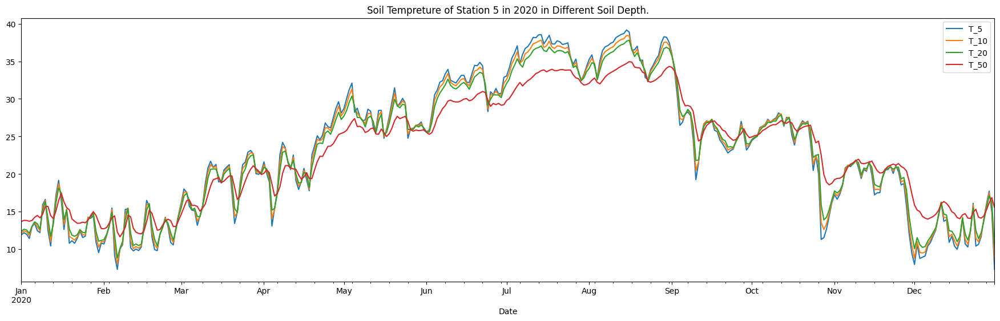

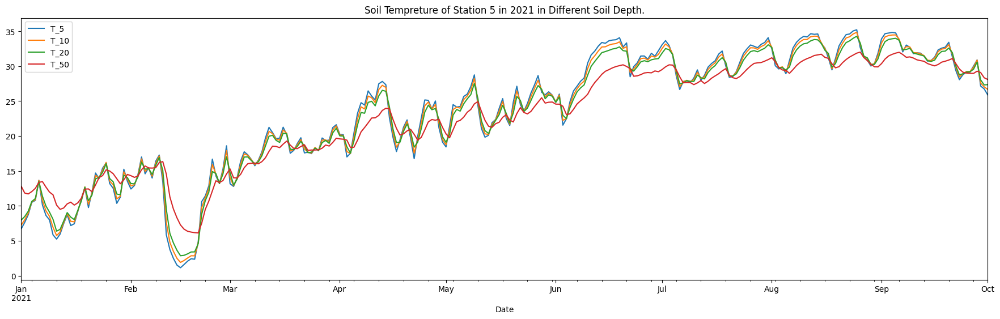

In [20]:
%matplotlib inline
years = [str(item) for item in range(2015, 2022)]
for station in range(0,5):
    for i in years:
        data[0].loc[i].resample('D').mean(numeric_only=True).plot(figsize=(22,6), y=["T_5", "T_10", "T_20", "T_50"])
        plt.title('Soil Tempreture of Station ' + str(station+1) +' in ' + str(i) + ' in Different Soil Depth.')
        plt.savefig("T_5_10_20_50_-Station-1-Year"+i+".pdf", format="pdf", bbox_inches="tight")
        plt.show()

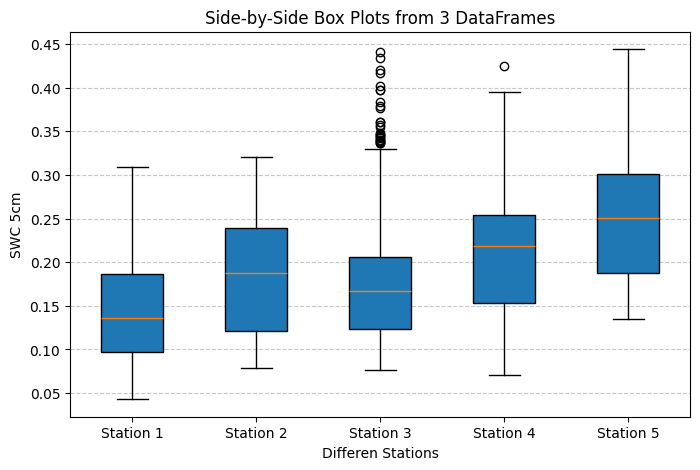

In [7]:
data_to_plot = [
    data[0]['SWC_5'].dropna(),
    data[1]['SWC_5'].dropna(),
    data[2]['SWC_5'].dropna(),
    data[3]['SWC_5'].dropna(),
    data[4]['SWC_5'].dropna()
]

# 3. Create the side-by-side box plots
plt.figure(figsize=(8, 5))
plt.boxplot(data_to_plot, patch_artist=True)

# 4. Customize the plot labels
plt.xticks([1, 2, 3, 4, 5], ['Station 1', 'Station 2', 'Station 3', 'Station 4', 'Station 5'])
plt.title('Side-by-Side Box Plots from 3 DataFrames')
plt.xlabel('Differen Stations')
plt.ylabel('SWC 5cm')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig("Boxplot_SWC_5"+i+".pdf", format="pdf", bbox_inches="tight")
plt.show()

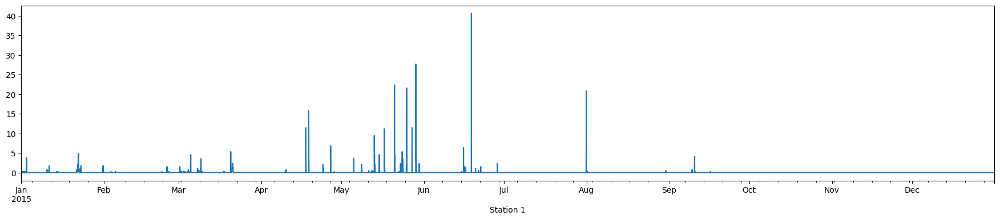

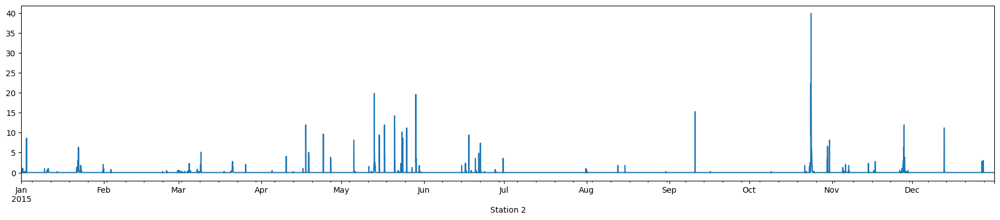

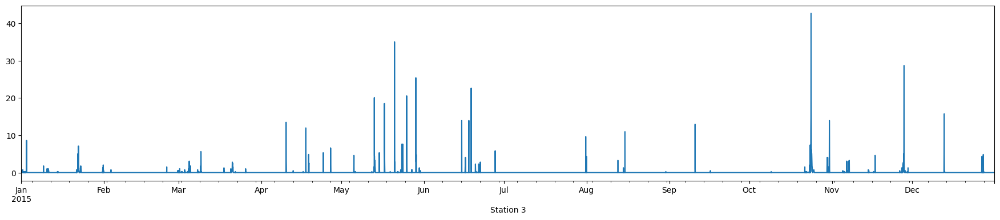

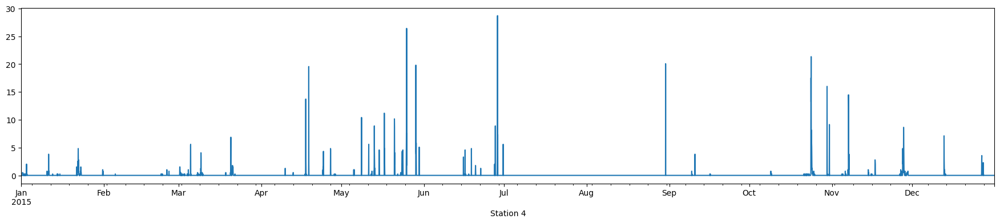

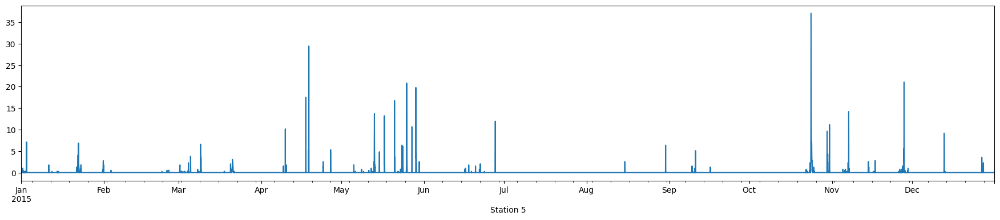

...

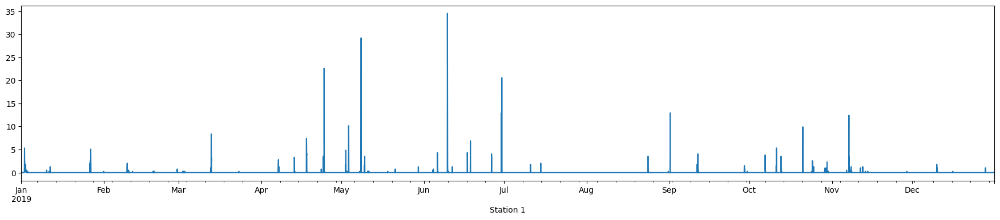

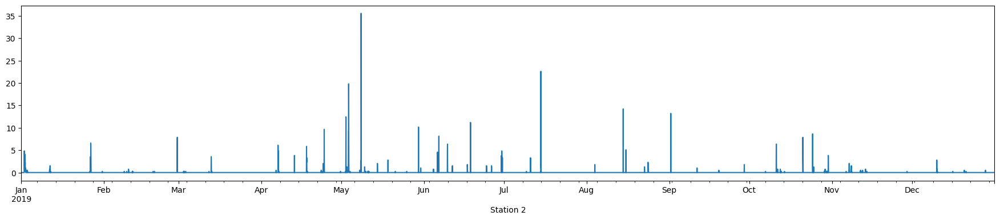

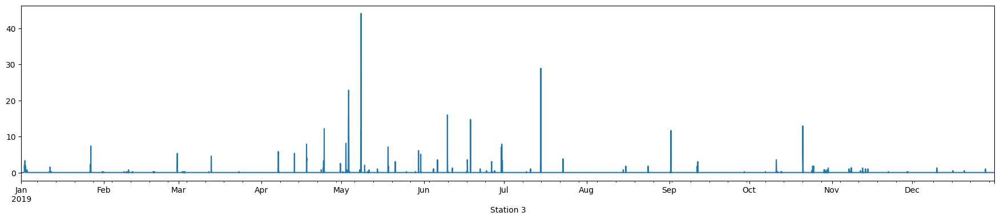

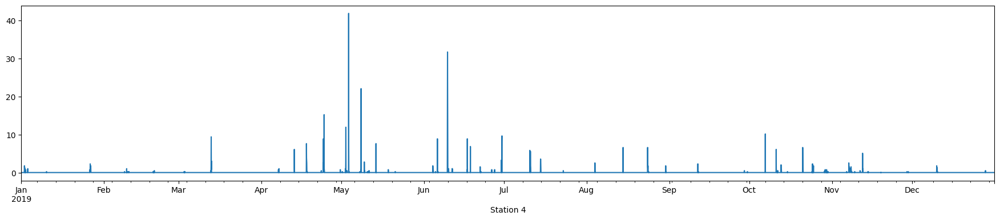

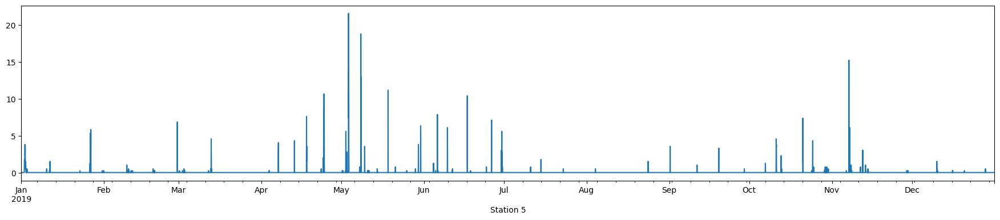

In [10]:
%matplotlib inline
years = [str(item) for item in range(2015, 2020)]
for i in years:
    for station in range(0,5):
        data[station].loc[i].Ppt.plot(figsize=(22,4), xlabel="Station "+ str(station+1) )
        plt.savefig("Ppt-Station-"+str(station)+"-year"+str(i)+".pdf", format="pdf", bbox_inches="tight")
        plt.show()

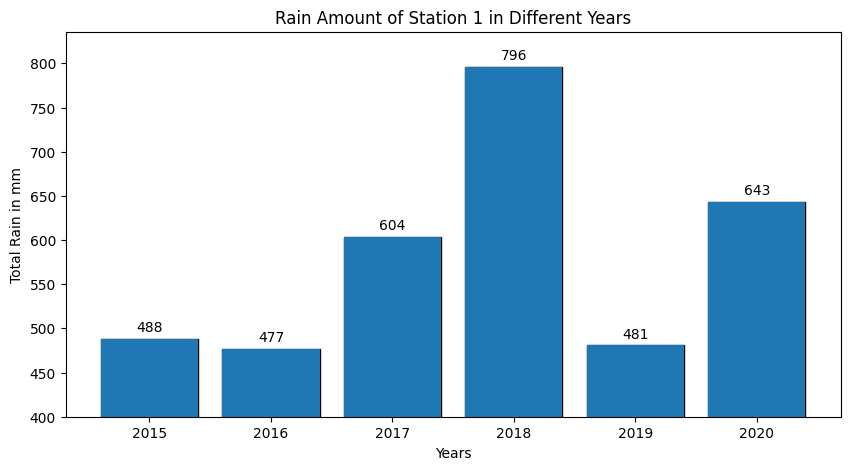

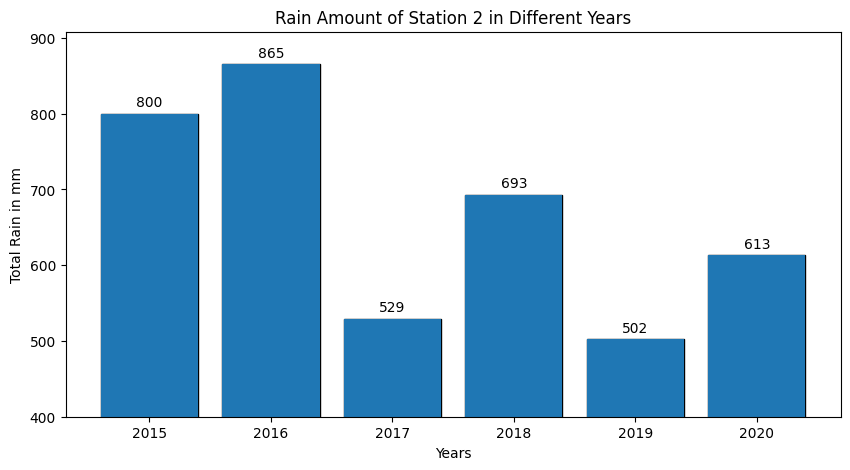

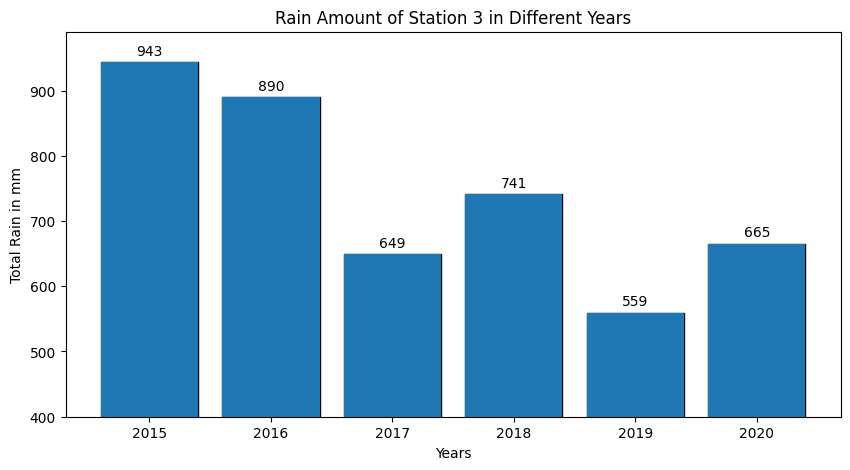

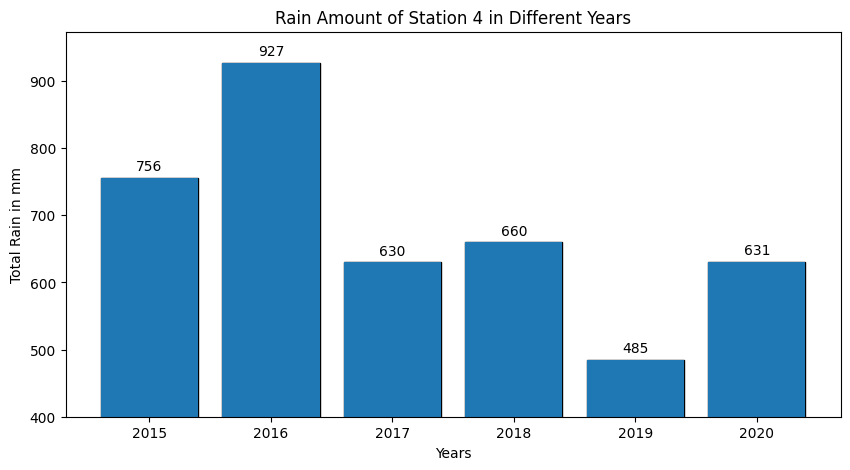

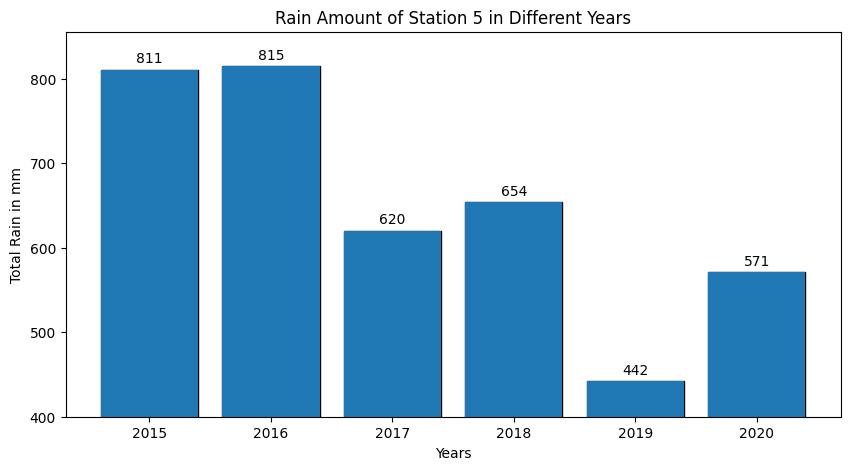

In [14]:
years = [str(item) for item in range(2015, 2021)]

for station in range(0,5):
    ppt_stations = []
    for i in years:
        ppt_sum = data[station].loc[i].Ppt.sum()
        ppt_stations.append(round(float(ppt_sum), 0))
    plt.figure(figsize=(10, 5))
    plt.bar(years, ppt_stations,  color='darkblue', edgecolor='black')
    # plt.xticks(x_positions, bar_labels)  # Replace numbers with your labels
    
    plt.bar_label(plt.bar(years, ppt_stations), padding=3)
    plt.title('Rain Amount of Station ' + str(station+1) +' in Different Years')
    plt.xlabel('Years')
    plt.ylabel('Total Rain in mm')
    plt.ylim(bottom=400)    
    # Show the plot
    plt.savefig("Ppt-Station-Barplot-Station"+str(station)+"-Year-"+str(i)+".pdf", format="pdf", bbox_inches="tight")
    plt.show() 